# Importing library

In [1]:
import os
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import measure
import math
import numpy as np
import pandas as pd

import geopandas as gpd
from shapely.geometry import Polygon
%matplotlib inline

# Single Image plot from github ripository

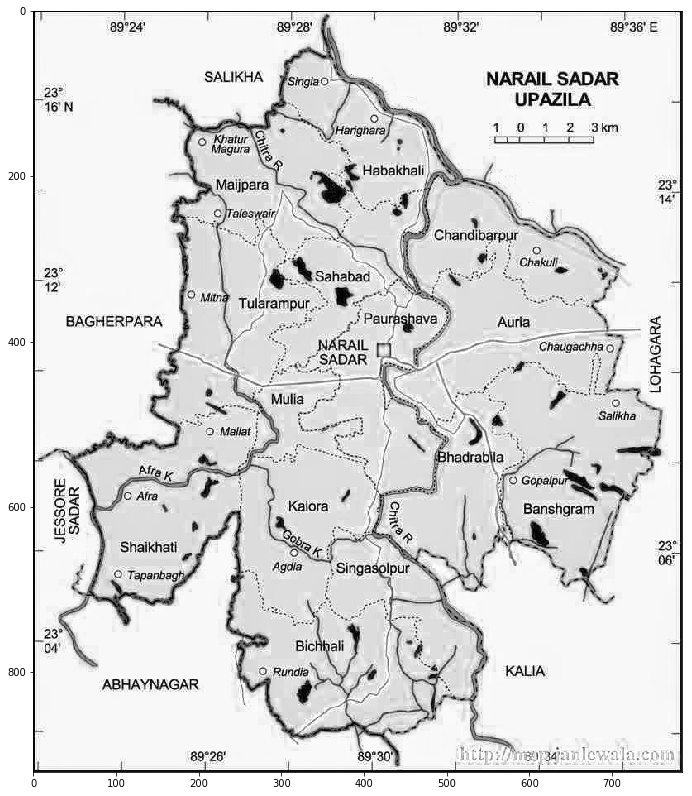

In [2]:
url = 'https://raw.githubusercontent.com/hasanbdimran/Features-extraction-with-python/master/narail_sadar_text_removed.png'
image = mpimg.imread(url)
test_image=image.copy()[:,:,0]
plt.figure(figsize=(14,14))
plt.imshow(test_image, cmap='gray');

# Histogram Analysis and feature extraction

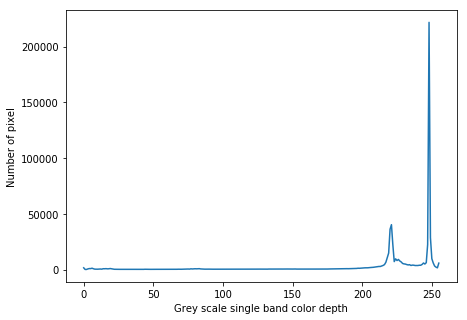

In [3]:
test_image = test_image*255
hist, bin_edge = np.histogram(test_image.ravel(), bins=256)
plt.figure(figsize=(7,5))
plt.plot(hist)
plt.ylabel('Number of pixel')
plt.xlabel('Grey scale single band color depth');

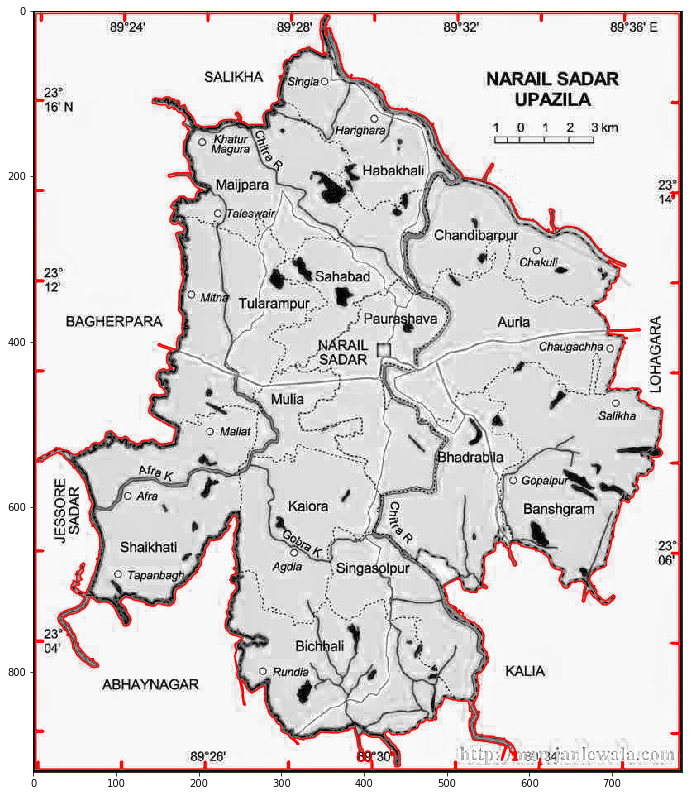

In [4]:
sv1 = np.array(measure.find_contours(test_image,197))
plt.figure(figsize=(14,14))
plt.imshow(test_image, cmap='gray')
plt.plot(sv1[0][:,1], sv1[0][:,0], color='r');

# Noise reduction

In [5]:
def filter_point(x, y,num_point, trial_xarr, trial_yarr):
    mask1 = np.ones(np.shape(trial_xarr), dtype=bool)
    
    for i in range(len(trial_xarr)):
        sumangel = 0
        for j in range(num_point):
            x1, y1 = x[j], y[j]
            x2, y2 = x[j+1], y[j+1]
            a = ((x1-x2)**2+(y1-y2)**2)**0.5
            c = ((x1-trial_xarr[i])**2+(y1-trial_yarr[i])**2)**0.5
            b = ((x2-trial_xarr[i])**2+(y2-trial_yarr[i])**2)**0.5
            an_v = (b**2+c**2-a**2)/(2*b*c)
            if an_v<-1:
                an_v=-1
            elif an_v>1:
                an_v=1
            else:
                an_v=an_v
            angel = math.acos(an_v)
            sumangel+=angel
        if sumangel <6.2831852:
            mask1[i]=False
    xf = trial_xarr[mask1]
    yf = trial_yarr[mask1]
    return xf, yf

In [6]:
def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

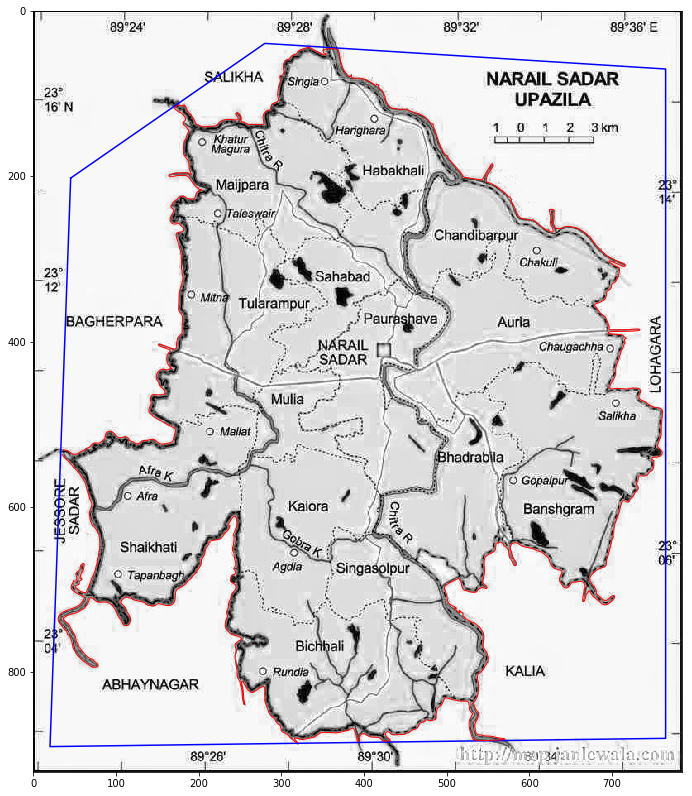

In [7]:
x = [45, 280, 765, 765, 20, 45]
y = [202, 39, 70, 880, 890, 202]
ck_an = filter_point(x, y, 5, sv1[0][:,1], sv1[0][:,0])
avg_win=7
xf = moving_average(ck_an[0], n=avg_win)
yf = moving_average(ck_an[1], n=avg_win)
plt.figure(figsize=(14,14))
plt.imshow(test_image, cmap='gray')
plt.plot(x, y, 'b-')
plt.plot(xf, yf, lw=1, color='r');

# Indirect Geo referencing

In [8]:
trace_image= plotly.offline.iplot({ "data": [go.Heatmap(z=test_image, colorscale='Greys')], 
                                  "layout": go.Layout(width=785, height=921, 
                                            yaxis=dict(autorange='reversed'))})

In [9]:
min_x=2 # Every 98 pixel along x axis equals 2 minutes
min_y=2 # Every 112 pixel along y axis equals 2 minutes
pix_x=98 # Pixel interval along x axis
pix_y=112 # Pixel interval along y axis
st_pix_x=122 # X pixel index of 1st GCP
st_pix_y=88 # Y pixel index of 1st GCP

starting_x = 89+(24/60)-((st_pix_x*min_x)/60/pix_x)
starting_y = 23+(16/60)+((st_pix_y*min_y)/60/pix_y)
mult_factor_x = (min_x/60)/pix_x
mult_factor_y = (min_y/60)/pix_y

x_ref=[]
y_ref=[]
for i in xf:
    x_ref.append(starting_x+(i*mult_factor_x))
for j in yf:
    y_ref.append(starting_y-(j*mult_factor_y))

In [10]:
df = pd.DataFrame({'Long':x_ref,'Lat':y_ref})
df['Coordinates'] = list(zip(df.Long, df.Lat))
df['Coordinates'] = Polygon(df['Coordinates'])
crs = {'init': 'epsg:4326'}
Narail_upazila = gpd.GeoDataFrame(df, geometry='Coordinates', crs=crs)

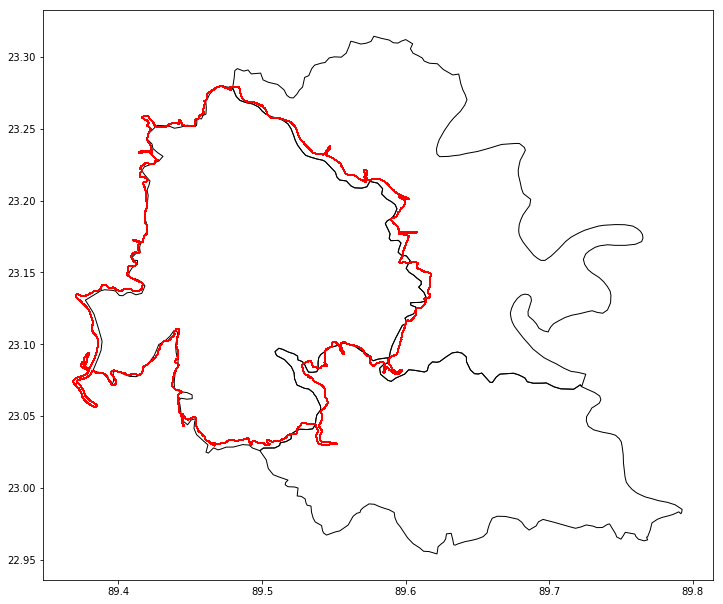

In [11]:
sdir1 = os.path.dirname('/Users/ihasan/Downloads/Blogging/Features extraction without digitizing/shapefile/Narail.shp')
Narail_actual = gpd.read_file(sdir1)
map1 = Narail_actual.plot(figsize=(12,12), facecolor='None', Edgecolor='k')
Narail_upazila.plot(ax=map1, facecolor='None', Edgecolor='r');